# LIGO - Gravitational Waves Detectability

In [1]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import joblib
import sys
sys.path.append(r"C:\Users\ricca\Documents\Unimib-Code\AstroStatistics\Notebooks")
from Utilities import plot_settings

Load downsampled data with balanced classes members

In [3]:
y = np.load(r"C:\Users\ricca\Documents\Unimib-Code\AstroStatistics\Notebooks\Exam\LIGO\Npy\y_ds.npy")

In [4]:
data = np.load(r"C:\Users\ricca\Documents\Unimib-Code\AstroStatistics\Notebooks\Exam\LIGO\Npy\data_ds.npy")

In [5]:
keys = np.load(r"C:\Users\ricca\Documents\Unimib-Code\AstroStatistics\Notebooks\Exam\LIGO\Npy\keys.npy")

Text(0.5, 1.0, 'Boxplots of Features')

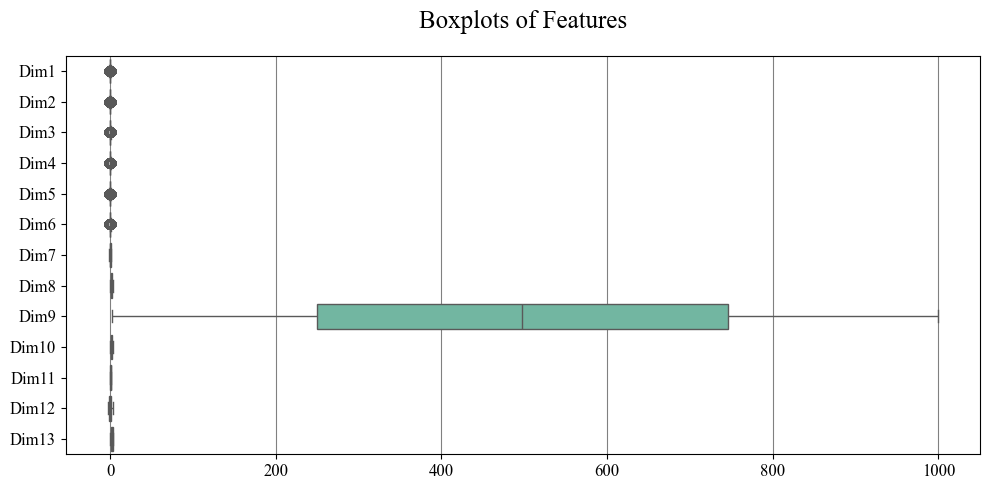

In [7]:
import seaborn as sns
import pandas as pd

# Convert to DataFrame for easier inspection
df = pd.DataFrame(data, columns=[f'Dim{i}' for i in range(1, 14)])

# Plot distributions
sns.boxplot(data=df, orient="h", palette="Set2")
plt.title("Boxplots of Features")

Seems like all the data are aligned with the $9^{th}$ dimension

In [8]:
from sklearn.preprocessing import StandardScaler, RobustScaler

In [9]:
S = StandardScaler().fit_transform(data)
R = RobustScaler().fit_transform(data)

Text(0.5, 1.0, 'Standard Scaling')

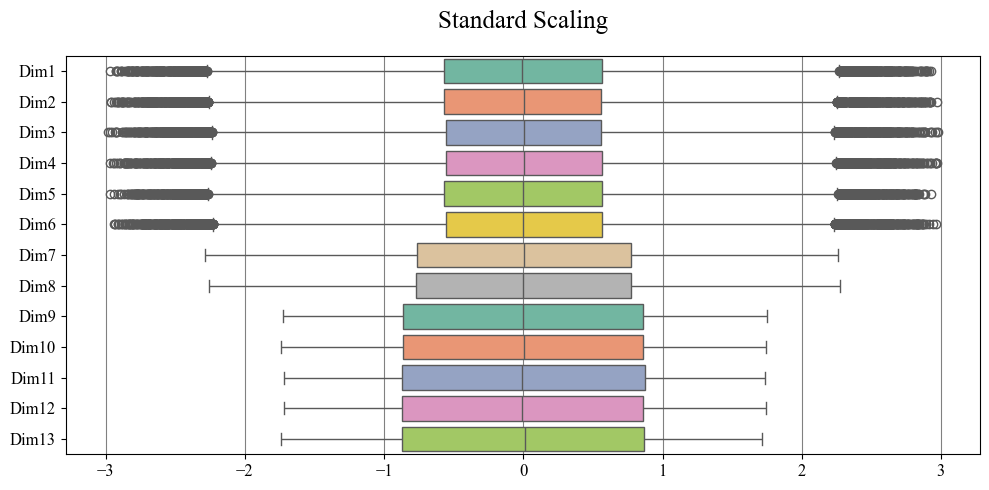

In [11]:
df = pd.DataFrame(S, columns=[f'Dim{i}' for i in range(1, 14)])

# Plot distributions
sns.boxplot(data=df, orient="h", palette="Set2")
plt.title("Standard Scaling")

Text(0.5, 1.0, 'Robust scaling')

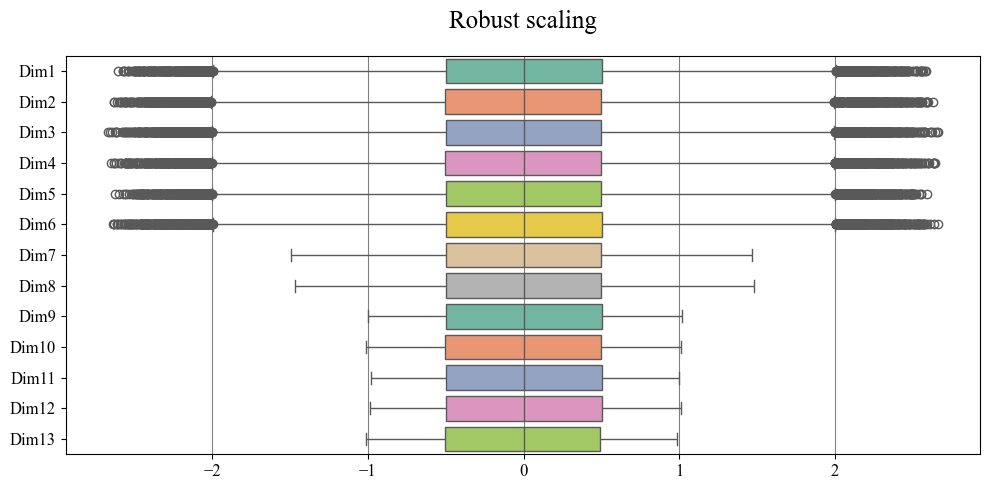

In [12]:
df = pd.DataFrame(R, columns=[f'Dim{i}' for i in range(1, 14)])

# Plot distributions
sns.boxplot(data=df, orient="h", palette="Set2")
plt.title("Robust scaling")

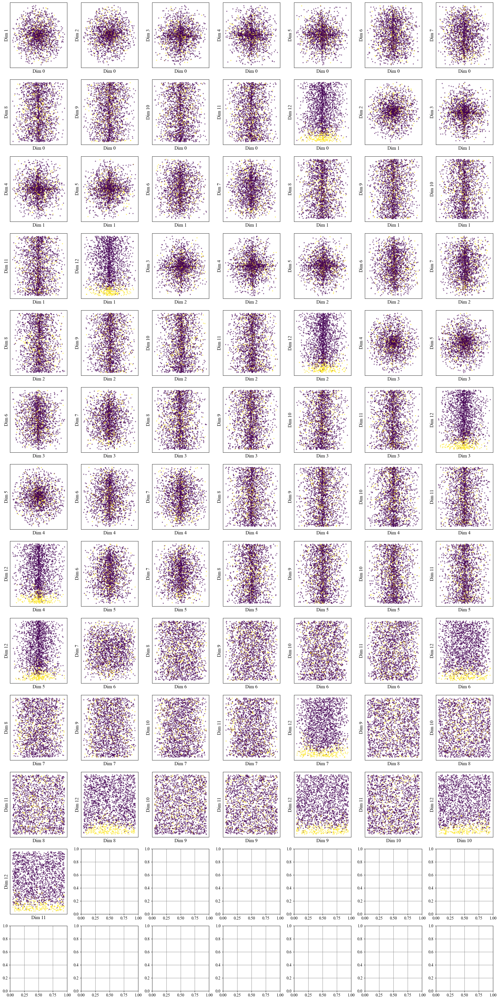

In [ ]:
import itertools

# Use a smaller subset for visualization
idx = np.random.choice(len(data), size=2000, replace=False)
data_small = data[idx]
labels_small = y[idx]

dims = range(13)
pairs = list(itertools.combinations(dims, 2))

fig, axes = plt.subplots(13, 7, figsize=(20, 40))  # adjust depending on layout
axes = axes.flatten()

for i, (dim1, dim2) in enumerate(pairs):
    ax = axes[i]
    scatter = ax.scatter(data_small[:, dim1], data_small[:, dim2],
                         c=labels_small, cmap='viridis', s=5, alpha=0.5)
    ax.set_xlabel(f'Dim {dim1}')
    ax.set_ylabel(f'Dim {dim2}')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()

I will use feature 12 vs feature 6 to visualize the classification algorithm results since there is less overlap between classes

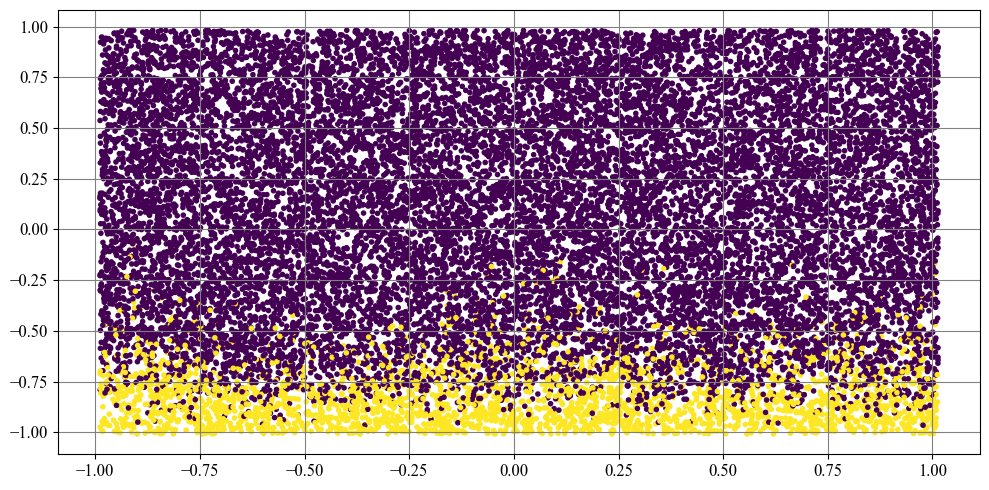

In [15]:
plt.scatter(R[:, 11], R[:, 12], c=y, marker='.')

In [16]:
from sklearn.model_selection import train_test_split
from Utilities.Classify_vs import evaluate_classifier_over_features, visualize_classification_generic_all, \
evaluate_classifier_over_features_all, visualize_classification_generic, plot_learning_curve, visualize_DT
from sklearn.linear_model import LogisticRegression as LR

In [17]:
A = np.vstack([R[:, 11], R[:, 12]]).T

In [18]:
a_train, a_test, b_train, b_test = train_test_split(A, y, test_size=0.33, shuffle=True, random_state=33)
R_train, R_test, y_train, y_test = train_test_split(R, y, test_size=0.33, shuffle=True, random_state=33)

## Logistic Regression

Computing predictions using first 1 features...
Computing predictions using first 2 features...
Computing predictions using first 3 features...
Computing predictions using first 4 features...
Computing predictions using first 5 features...
Computing predictions using first 6 features...
Computing predictions using first 7 features...
Computing predictions using first 8 features...
Computing predictions using first 9 features...
Computing predictions using first 10 features...
Computing predictions using first 11 features...
Computing predictions using first 12 features...
Computing predictions using first 13 features...


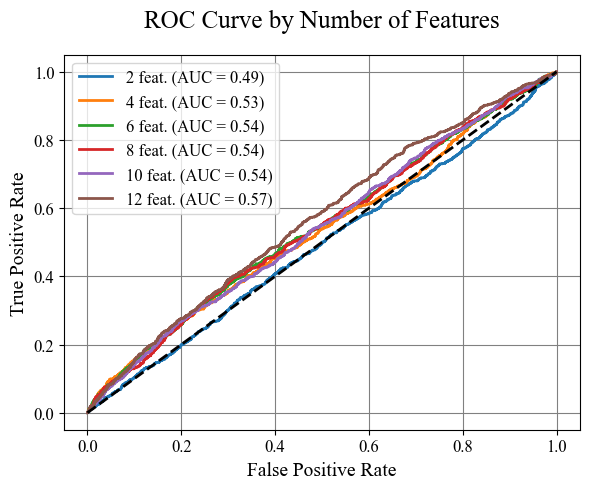

In [25]:
result = evaluate_classifier_over_features(R_train, R_test, y_train, y_test, LR())

In [26]:
from sklearn.model_selection import learning_curve, KFold
custom_cv = KFold(n_splits=10, shuffle=True, random_state=42)

In [27]:
train_sizes, train_scores, test_scores = learning_curve(result['best_classifier'], A, y, train_sizes=np.linspace(0.1, 1, 10), cv=custom_cv)

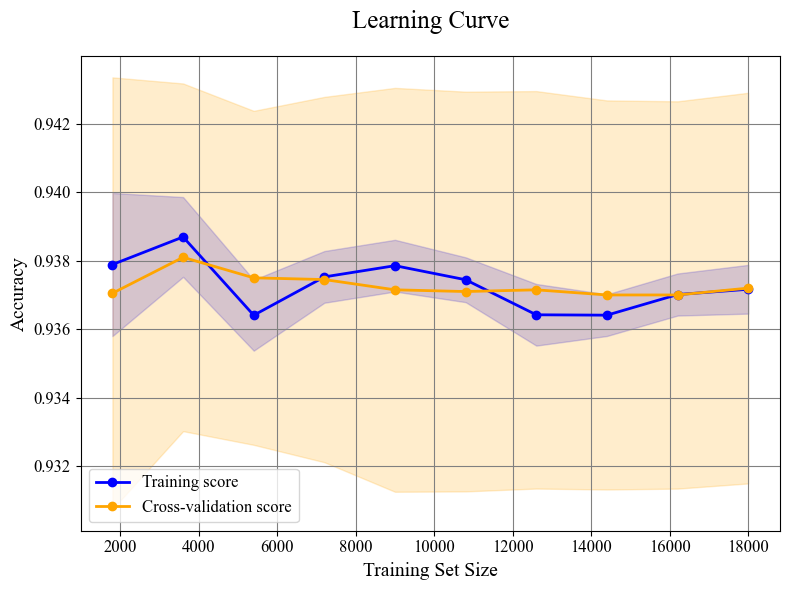

In [28]:
plot_learning_curve(train_sizes, train_scores, test_scores)

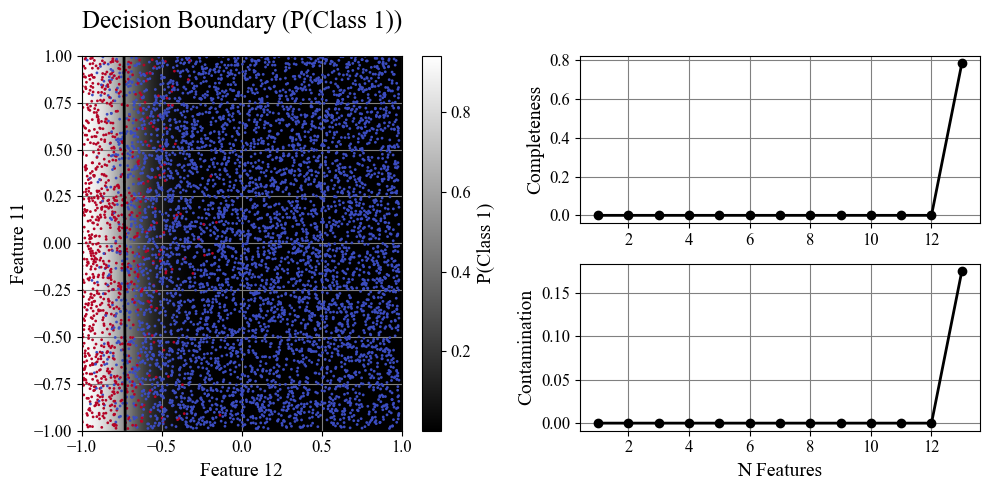

In [32]:
visualize_classification_generic(R_test[:, :result['best_n_features']], y_test, 
                                 result['best_classifier'],
                                 result['completeness'][:result['best_n_features']], 
                                 result['contamination'][:result['best_n_features']], 
                                 limits=[-1,1,-1,1],
                                 f=1, a=11, b=12)

## Support Vector Machine

In [35]:
from sklearn.svm import SVC

### Linear Kernel

In [36]:
clf = 0
clf = SVC(kernel='linear', gamma='scale', C=1.0, probability=True)

Computing predictions using first 1 features...
Computing predictions using first 2 features...
Computing predictions using first 3 features...
Computing predictions using first 4 features...
Computing predictions using first 5 features...
Computing predictions using first 6 features...
Computing predictions using first 7 features...
Computing predictions using first 8 features...
Computing predictions using first 9 features...
Computing predictions using first 10 features...
Computing predictions using first 11 features...
Computing predictions using first 12 features...
Computing predictions using first 13 features...


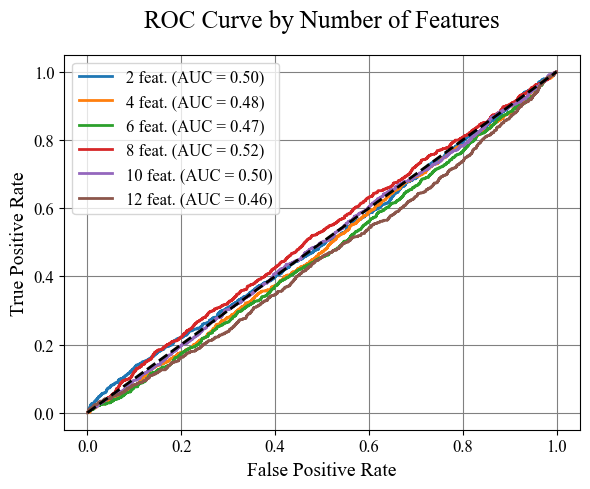

In [38]:
result = 0
result = evaluate_classifier_over_features(R_train, R_test, y_train, y_test, clf)

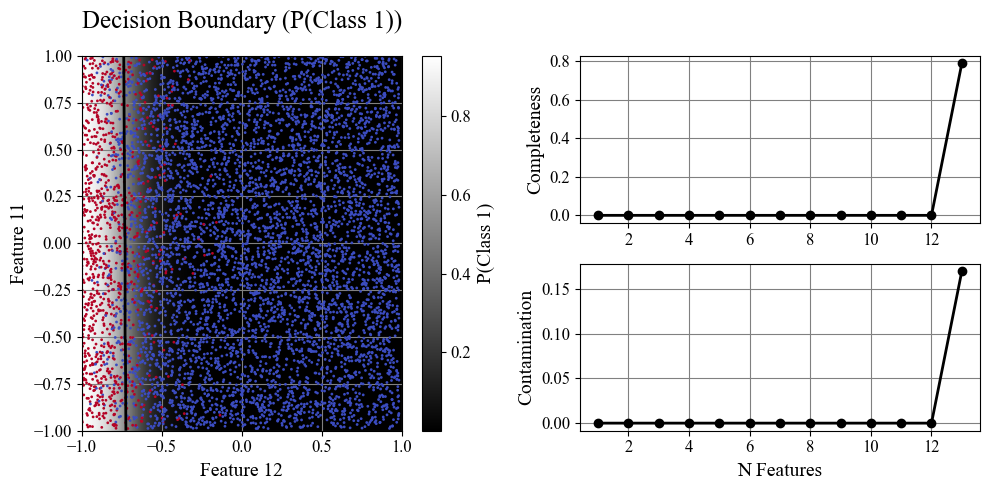

In [43]:
visualize_classification_generic(R_test[:, :result['best_n_features']], y_test, 
                                 result['best_classifier'],
                                 result['completeness'][:result['best_n_features']], 
                                 result['contamination'][:result['best_n_features']], 
                                 limits=[-1,1,-1,1],
                                 f=1, a=11, b=12)

### Polynomial Kernel

In [47]:
clf = 0
clf = SVC(kernel='poly', gamma='scale', C=1.0, probability=True)

Computing predictions using first 1 features...
Computing predictions using first 2 features...
Computing predictions using first 3 features...
Computing predictions using first 4 features...
Computing predictions using first 5 features...
Computing predictions using first 6 features...
Computing predictions using first 7 features...
Computing predictions using first 8 features...
Computing predictions using first 9 features...
Computing predictions using first 10 features...
Computing predictions using first 11 features...
Computing predictions using first 12 features...
Computing predictions using first 13 features...


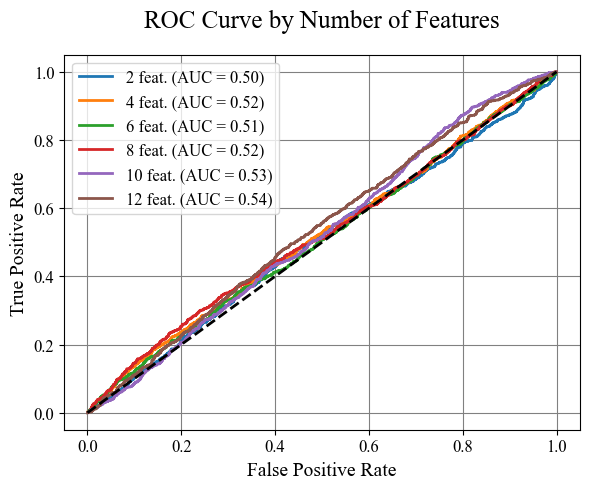

In [48]:
result = 0
result = evaluate_classifier_over_features(R_train, R_test, y_train, y_test, clf)

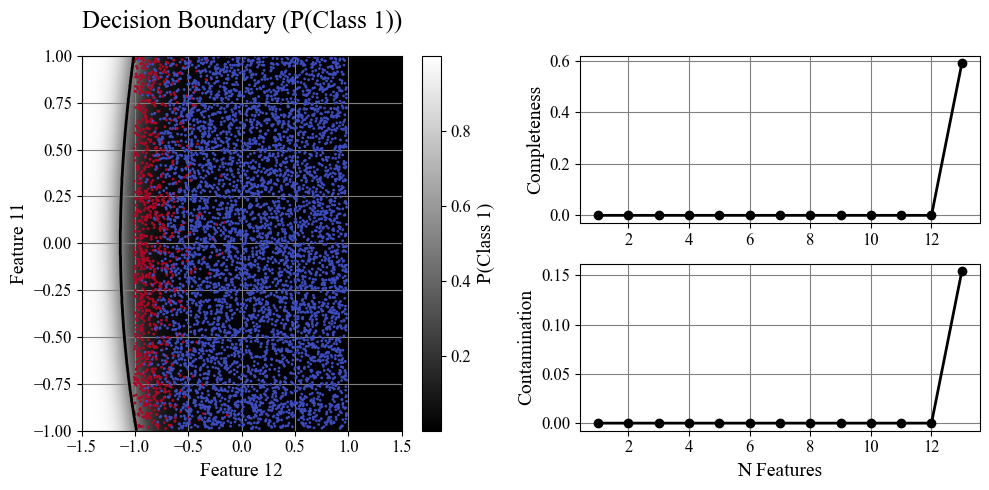

In [50]:
visualize_classification_generic(R_test[:, :result['best_n_features']], y_test, 
                                 result['best_classifier'],
                                 result['completeness'][:result['best_n_features']], 
                                 result['contamination'][:result['best_n_features']], 
                                 limits=[-1.5,1.5,-1,1],
                                 f=1, a=11, b=12)

In [51]:
print('Completeness:  ', result['completeness'])
print('Contamination: ', result['contamination'])

Completeness:   [0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.58895706]
Contamination:  [0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.15418502]


### RBF Kernel

In [52]:
clf = SVC(kernel='rbf', gamma='scale', C=1.0, probability=True)

Computing predictions using first 1 features...
Computing predictions using first 2 features...
Computing predictions using first 3 features...
Computing predictions using first 4 features...
Computing predictions using first 5 features...
Computing predictions using first 6 features...
Computing predictions using first 7 features...
Computing predictions using first 8 features...
Computing predictions using first 9 features...
Computing predictions using first 10 features...
Computing predictions using first 11 features...
Computing predictions using first 12 features...
Computing predictions using first 13 features...


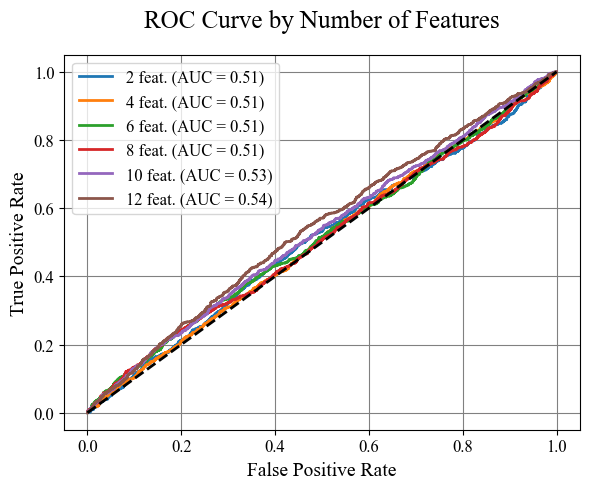

In [54]:
result = 0
result = evaluate_classifier_over_features(R_train, R_test, y_train, y_test, clf)

In [55]:
print('Completeness:  ', result['completeness'])
print('Contamination: ', result['contamination'])

Completeness:   [0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.80163599]
Contamination:  [0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.12791991]


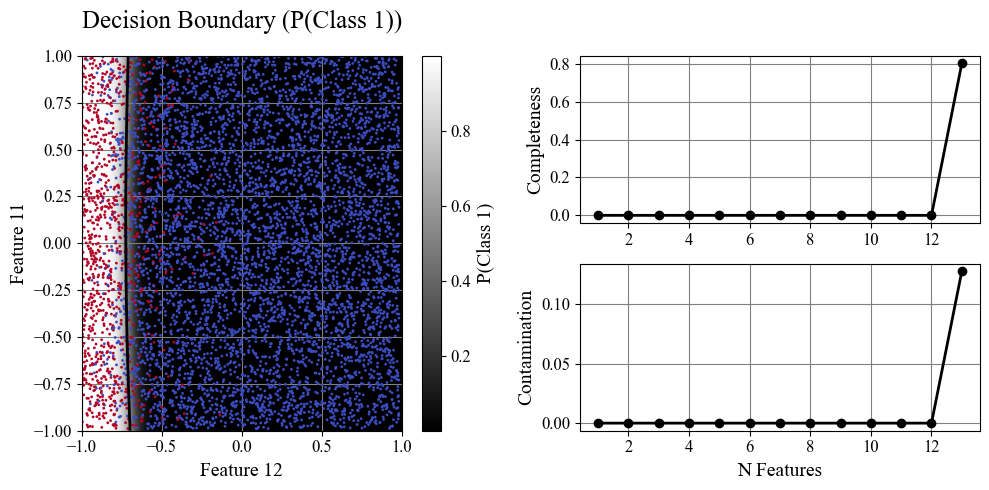

In [59]:
visualize_classification_generic(R_test[:, :result['best_n_features']], y_test, 
                                 result['best_classifier'],
                                 result['completeness'][:result['best_n_features']], 
                                 result['contamination'][:result['best_n_features']], 
                                 limits=[-1,1,-1,1],
                                 f=1, a=11, b=12)

## Decision Tree

In [60]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from Utilities.Classify_vs import evaluate_DT, visualize_DT

Computing predictions using first 1 features...
Computing predictions using first 2 features...
Computing predictions using first 3 features...
Computing predictions using first 4 features...
Computing predictions using first 5 features...
Computing predictions using first 6 features...
Computing predictions using first 7 features...
Computing predictions using first 8 features...
Computing predictions using first 9 features...
Computing predictions using first 10 features...
Computing predictions using first 11 features...
Computing predictions using first 12 features...
Computing predictions using first 13 features...


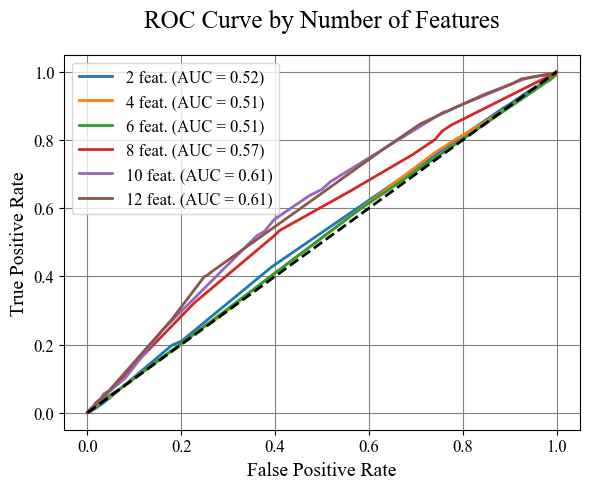

In [62]:
clf = DecisionTreeClassifier(criterion='gini', max_depth=6)
result = 0
result = evaluate_classifier_over_features(R_train, R_test, y_train, y_test, clf)

In [63]:
result = 0
depths=[1, 10, 100]
result = 0
result = evaluate_DT(A, a_train, a_test, b_train, b_test, clf, depths)

completeness [array([0.        , 0.82617587]), array([0.00817996, 0.66768916]), array([0.15439673, 0.70449898])]
contamination [array([0.        , 0.23266857]), array([0.78378378, 0.18881988]), array([0.83693305, 0.27473684])]


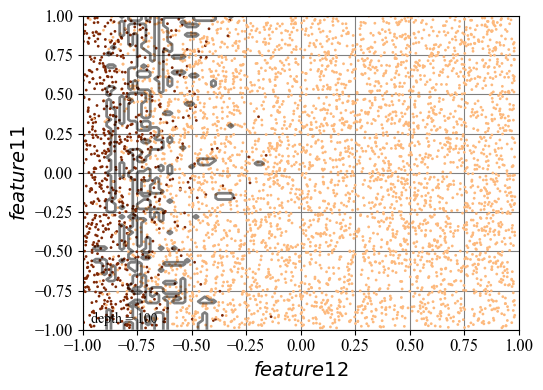

In [66]:
visualize_DT(R_test, y_test, result['classifiers'],
            result['completeness'], result['contamination'],
            depths=depths, Ncolors=np.linspace(1,2,2, dtype=int),
            xlim=(-1,1), ylim=(-1,1),
            a=11, b=12)

In [67]:
#------------------------------------------------------------
# Compute the cross-validation scores for several tree depths
depth = np.linspace(1, 30, 30, dtype=int)
rms_test = np.zeros(len(depth))
rms_train = np.zeros(len(depth))
i_best = 0
z_fit_best = None

for i, d in enumerate(depth):
    clf = DecisionTreeRegressor(max_depth=d, random_state=0)
    clf.fit(a_train, b_train)

    z_fit_train = clf.predict(a_train)
    z_fit = clf.predict(a_test)
    rms_train[i] = np.mean(np.sqrt((z_fit_train - b_train) ** 2))
    rms_test[i] = np.mean(np.sqrt((z_fit - b_test) ** 2))

    if rms_test[i] <= rms_test[i_best]:
        i_best = i
        z_fit_best = z_fit

best_depth = depth[i_best]
print(f'best_depth = {best_depth}')

best_depth = 25


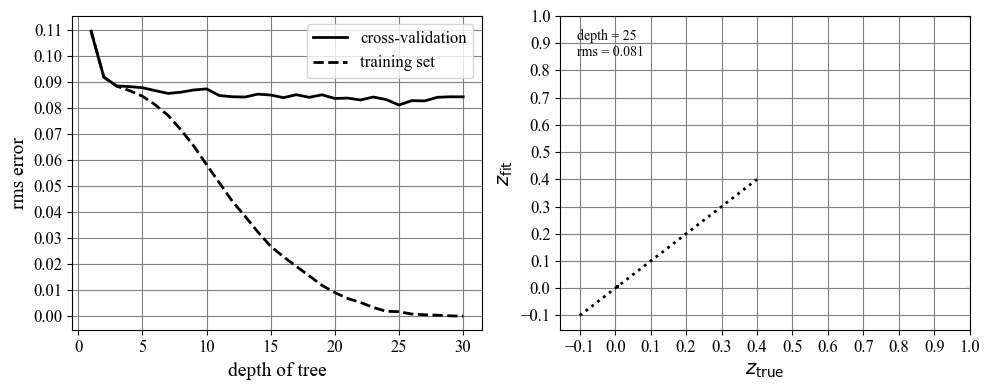

In [71]:
fig = plt.figure(figsize=(10, 4))
fig.subplots_adjust(wspace=0.25,
                    left=0.1, right=0.95,
                    bottom=0.15, top=0.9)

ax = fig.add_subplot(121)
ax.plot(depth, rms_test, '-k', label='cross-validation')
ax.plot(depth, rms_train, '--k', label='training set')
ax.set_xlabel('depth of tree')
ax.set_ylabel('rms error')
ax.yaxis.set_major_locator(plt.MultipleLocator(0.01))
ax.legend(loc=1)

# second panel: best-fit results
ax = fig.add_subplot(122)
edges = np.linspace(y_test.min(), y_test.max(), 101)
H, zs_bins, zp_bins = np.histogram2d(y_test, z_fit_best, bins=edges)
ax.imshow(H.T, origin='lower', interpolation='nearest', aspect='auto', 
           extent=[zs_bins[0], zs_bins[-1], zs_bins[0], zs_bins[-1]],
           cmap=plt.cm.binary)
ax.plot([-0.1, 0.4], [-0.1, 0.4], ':k')
ax.text(0.04, 0.96, "depth = %i\nrms = %.3f" % (best_depth, rms_test[i_best]),
        ha='left', va='top', transform=ax.transAxes)
ax.set_xlabel(r'$z_{\rm true}$')
ax.set_ylabel(r'$z_{\rm fit}$')

#ax.set_xlim(-0.1, 0.4001)
#ax.set_ylim(-0.1, 0.4001)
ax.xaxis.set_major_locator(plt.MultipleLocator(0.1))
ax.yaxis.set_major_locator(plt.MultipleLocator(0.1))

plt.show()

In [73]:
result = 0
result = evaluate_DT(R, R_train, R_test, y_train, y_test, clf, [25])

completeness [array([0.13190184, 0.14489796, 0.1563981 , 0.17086093, 0.17711172,
       0.17087379, 0.18181818, 0.16079812, 0.21525215, 0.20828258,
       0.18223235, 0.20473373, 0.77505112])]
contamination [array([0.85121107, 0.84361233, 0.85311573, 0.82425068, 0.81690141,
       0.84931507, 0.8440678 , 0.84994524, 0.80359147, 0.81392818,
       0.82475356, 0.81030702, 0.17429194])]


## Bagging

In [79]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

In [80]:
bag_clf = BaggingClassifier(
    DecisionTreeClassifier(random_state=42), 
    n_estimators=500, max_samples=100, 
    bootstrap=True, random_state=42, n_jobs=-1)

In [81]:
bag_clf.fit(R_train, y_train)

BaggingClassifier(estimator=DecisionTreeClassifier(random_state=42),
                  max_samples=100, n_estimators=500, n_jobs=-1,
                  random_state=42)

In [82]:
y_pred_bag = bag_clf.predict(R_test)

In [86]:
def plot_decision_boundary(clf, X, y, axes=[-1, 1, -1.5, 1.5], alpha=0.5, contour=True):
    x1s = np.linspace(axes[0], axes[1], 100)
    x2s = np.linspace(axes[2], axes[3], 100)
    x1, x2 = np.meshgrid(x1s, x2s)
    X_new = np.c_[x1.ravel(), x2.ravel()]
    y_pred = clf.predict(X_new).reshape(x1.shape)
    
    plt.contourf(x1, x2, y_pred, alpha=0.3, cmap='cool')
    plt.plot(X[:, 0][y==12], X[:, 11][y==0], "o", alpha=alpha)
    plt.plot(X[:, 0][y==12], X[:, 11][y==1], "s", alpha=alpha)
    if contour:
        plt.contour(x1, x2, y_pred, cmap='cool', alpha=0.8)
    plt.axis(axes)
    plt.xlabel(r"$x_1$", fontsize=18)
    plt.ylabel(r"$x_2$", fontsize=18, rotation=0)

ValueError: x and y must have same first dimension, but have shapes (0,) and (17173,)

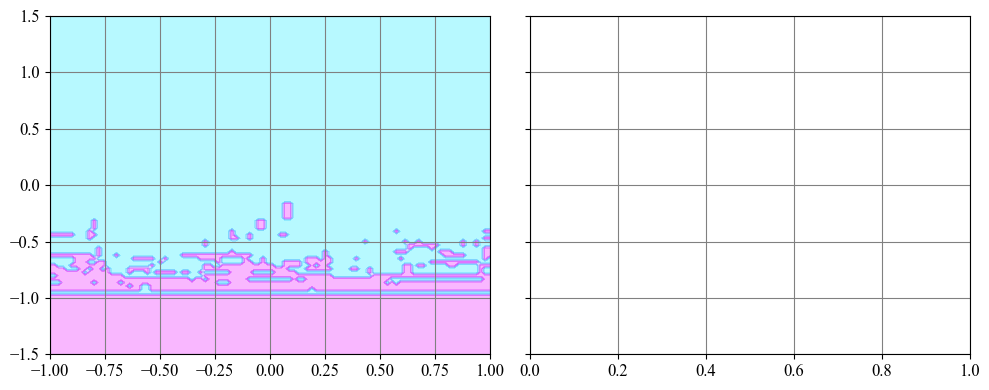

In [87]:
fix, axes = plt.subplots(ncols=2, figsize=(10,4), sharey=True)

plt.sca(axes[0])
plot_decision_boundary(clf, R, y, alpha=0.2)
plt.title("Decision Tree", fontsize=14)

plt.sca(axes[1])
plot_decision_boundary(bag_clf, R, y, alpha=0.2)
plt.title("Decision Trees with Bagging", fontsize=14)

plt.ylabel("")
plt.show()

In [90]:
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
ranfor = RandomForestClassifier(10)
ranfor.fit(a_train,y_train)

y_pred = ranfor.predict(a_test)

In [91]:
def compute_photoz_forest(depth):
    rms_test = np.zeros(len(depth))
    rms_train = np.zeros(len(depth))
    i_best = 0
    z_fit_best = None

    for i, d in enumerate(depth):
        clf = RandomForestRegressor(n_estimators=10,
                                    max_depth=d, random_state=0)
        clf.fit(a_train, b_train)

        z_fit_train = clf.predict(a_train)
        z_fit = clf.predict(a_test)
        rms_train[i] = np.mean(np.sqrt((z_fit_train - b_train) ** 2))
        rms_test[i] = np.mean(np.sqrt((z_fit - b_test) ** 2))

        if rms_test[i] <= rms_test[i_best]:
            i_best = i
            z_fit_best = z_fit

    return rms_test, rms_train, i_best, z_fit_best


depth = np.arange(1, 21)
rms_test, rms_train, i_best, z_fit_best = compute_photoz_forest(depth)
best_depth = depth[i_best]

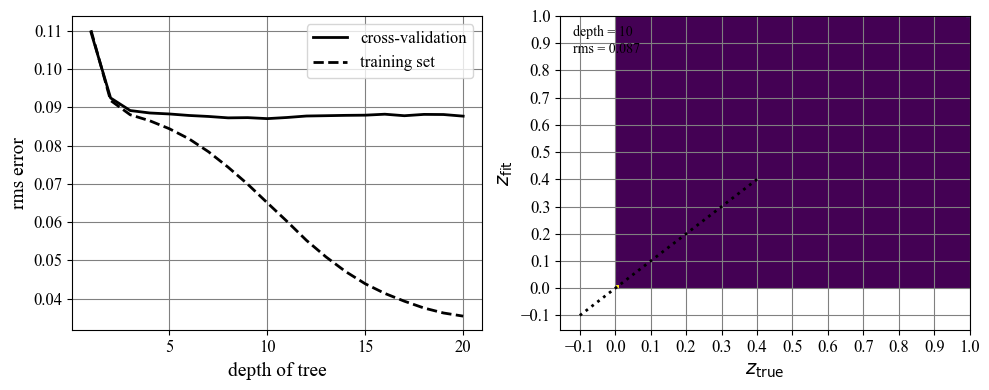

In [92]:
fig = plt.figure(figsize=(10, 4))
fig.subplots_adjust(wspace=0.25,
                    left=0.1, right=0.95,
                    bottom=0.15, top=0.9)

# left panel: plot cross-validation results
ax = fig.add_subplot(121)
ax.plot(depth, rms_test, '-k', label='cross-validation')
ax.plot(depth, rms_train, '--k', label='training set')
ax.legend(loc=1)

ax.set_xlabel('depth of tree')
ax.set_ylabel('rms error')

#ax.set_xlim(0, 21)
#ax.set_ylim(0.009,  0.04)
ax.yaxis.set_major_locator(plt.MultipleLocator(0.01))

# right panel: plot best fit
ax = fig.add_subplot(122)

edges = np.linspace(y_test.min(), y_test.max(), 101)
H, zs_bins, zp_bins = np.histogram2d(y_test, z_fit_best, bins=edges)
ax.imshow(H.T, origin='lower', interpolation='nearest', aspect='auto', 
           extent=[zs_bins[0], zs_bins[-1], zs_bins[0], zs_bins[-1]],
           cmap='viridis')

ax.plot([-0.1, 0.4], [-0.1, 0.4], ':k')
ax.text(0.03, 0.97, "depth = %i\nrms = %.3f" % (best_depth, rms_test[i_best]),
        ha='left', va='top', transform=ax.transAxes)

ax.set_xlabel(r'$z_{\rm true}$')
ax.set_ylabel(r'$z_{\rm fit}$')

#ax.set_xlim(-0.02, 0.4001)
#ax.set_ylim(-0.02, 0.4001)
ax.xaxis.set_major_locator(plt.MultipleLocator(0.1))
ax.yaxis.set_major_locator(plt.MultipleLocator(0.1))

plt.show()